In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

from sklearn.metrics import confusion_matrix, accuracy_score, ConfusionMatrixDisplay

import os
from os import walk

In [2]:
classes = {"buildings":0,"forest":1,"glacier":2, "mountain":3, "sea":4, "street":5}
dir_pred = "C://Users//amina//Downloads//archive (4)//seg_pred\seg_pred"
dir_test = "C://Users//amina//Downloads//archive (4)//seg_test//seg_test"
dir_train = "C://Users//amina//Downloads//archive (4)//seg_train//seg_train"

In [3]:
# read in the names of the images in the prediction set
(dirpath_pred, dirnames_pred, fnames_pred) = next(walk(dir_pred))
print("Size of the prediction set is {}".format(len(fnames_pred)))

Size of the prediction set is 7301


In [5]:
def read_image_names_class(dpath):
    fnames = {}
    x, dirnames, y = next(walk(dpath))
    for d in dirnames:
        _,_,temp = next(walk(os.path.join(dpath,d)))
        fnames[classes[d]] = temp        
    
    return dirnames, fnames

def check_class_imbalance(fnames):
    count = 0
    class_summary = {}
    for key,value in fnames.items():
        count = count + len(value)
        class_summary[key] = len(value)
        
    summary = pd.DataFrame.from_dict(class_summary, orient='index', columns=["Count"])  
    summary['CumCount'] = np.cumsum(summary['Count']) 
    summary['Class'] = summary.index
    summary['Class'] = summary['Class'].apply(class_from_key)
    
    return summary

def class_from_key(x):
    for key, value in classes.items():
        if x == value:
            return key
        
def sample_images_from_class(nsample, classname, path, fnames):
    sind = np.random.random_integers(1,len(fnames[classes[classname]]),nsample)
    spath = [os.path.join(path, classname, fnames[classes[classname]][i]) for i in sind]
    
    return spath

def plot_sampled_images(path, fnames):
    nsample = 3
    ncols = len(classes)
    
    fig, ax = plt.subplots(nsample, ncols, figsize=(20, 3*nsample))
    
    for i,cl in enumerate(classes.keys()):
        sp = sample_images_from_class(nsample, cl, path, fnames)
        for j,spj in enumerate(sp):            
            img = mpimg.imread(spj)
            ax[j,i].imshow(img)
            ax[j,i].axis('off')
            ax[j,i].set_title(cl)   
            
def plot_sampled_prediction_images(path, fnames):    
    nsample = 3
    ncols = len(classes)
    
    fig, ax = plt.subplots(nsample, ncols, figsize=(20, 3*nsample))
    sind = np.random.random_integers(1,len(fnames), nsample*ncols)
    
    axs = ax.ravel()
    for i, sp in enumerate(sind):
        spj = os.path.join(path, fnames[sp])
        img = mpimg.imread(spj)
        axs[i].imshow(img)
        axs[i].axis('off')
    
def get_true_pred(model, ds):
    y = model.predict(ds)

    ytrue = []
    ypred = []

    ypred.append(np.argmax(y,axis=1))
    for img, lbl in ds:
        for l in lbl:
            ytrue.append(np.argmax(l.numpy()))    
    
    return ytrue, ypred

def plot_confMat(ytrue, ypred):
    cm = confusion_matrix(y_true = ytrue,y_pred = ypred[0])
    cmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_from_key(x) for x in range(6)])
    cmd.plot(include_values=True, cmap = plt.cm.Blues, ax=None)

    plt.title("Accuracy score is {:.2f}".format(accuracy_score(y_true = ytrue,y_pred = ypred[0])))

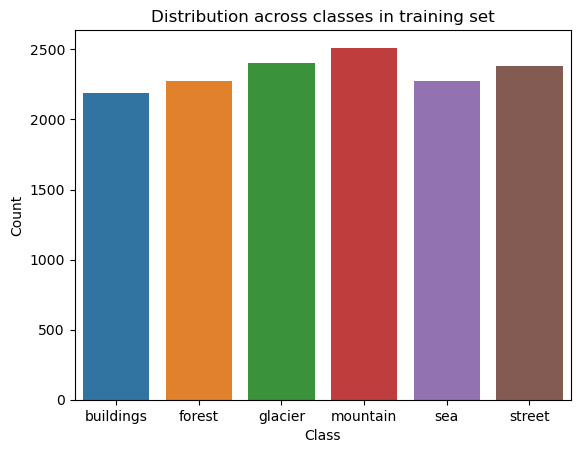

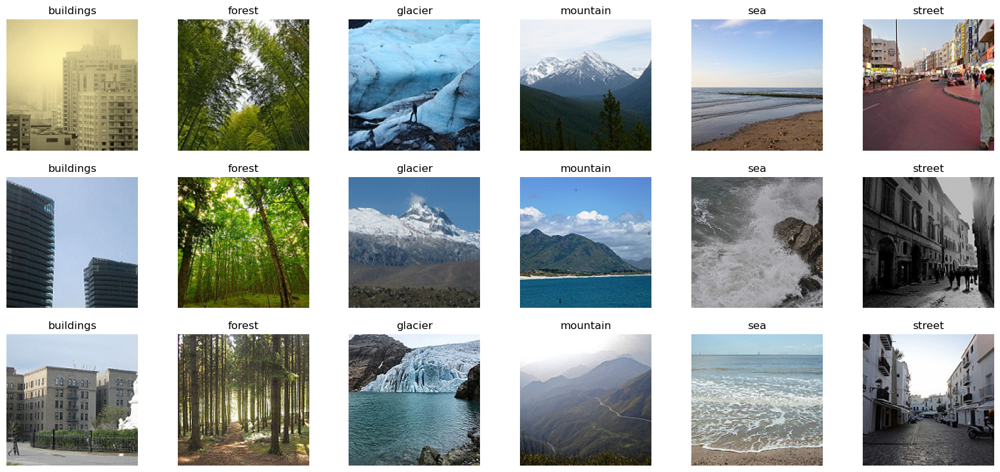

In [6]:
dirnames_train, fnames_train = read_image_names_class(dir_train)
train_summary = check_class_imbalance(fnames_train)
train_summary.head(10)
sns.barplot(data=train_summary, x = 'Class', y='Count').set_title("Distribution across classes in training set")
plot_sampled_images(dir_train, fnames_train)

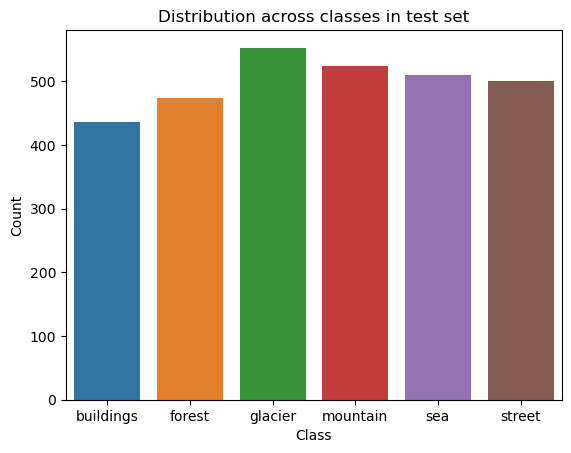

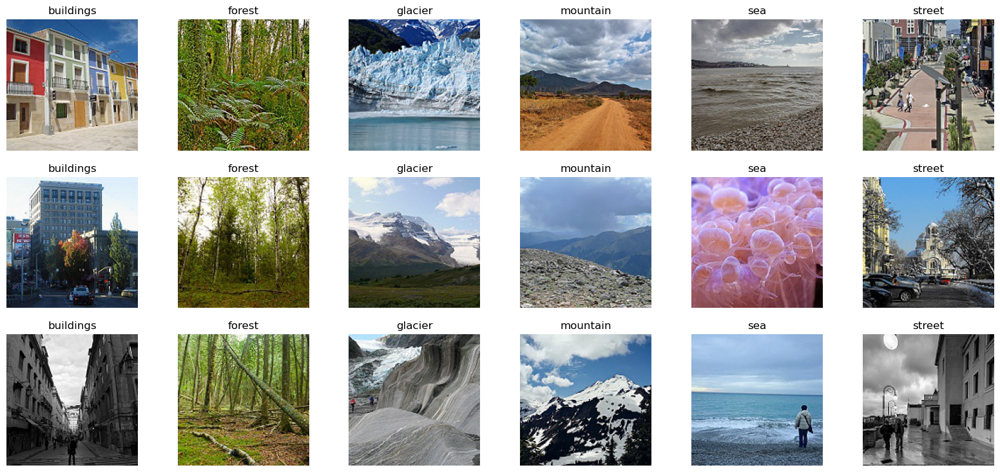

In [7]:
dirnames_test, fnames_test = read_image_names_class(dir_test)
test_summary = check_class_imbalance(fnames_test)
test_summary.head(10)

sns.barplot(data=test_summary, x = 'Class', y='Count').set_title("Distribution across classes in test set")

plot_sampled_images(dir_test, fnames_test)

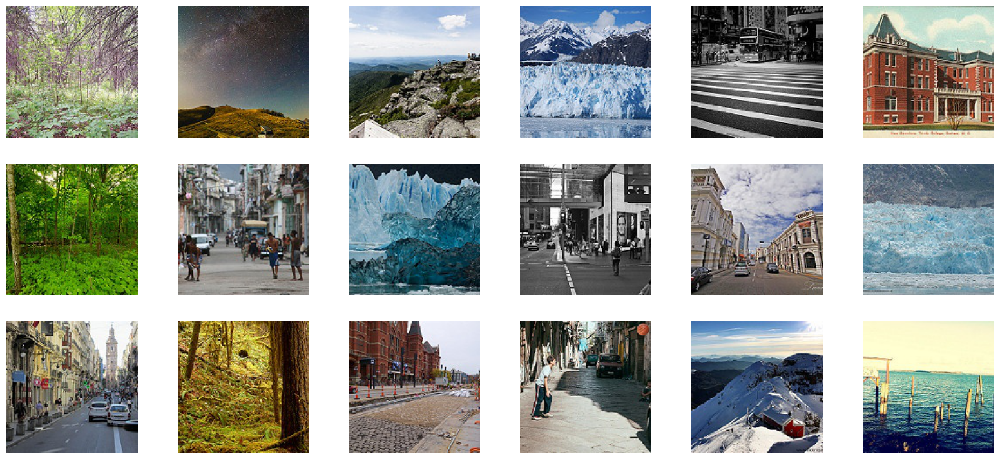

In [8]:
plot_sampled_prediction_images(dir_pred, fnames_pred)

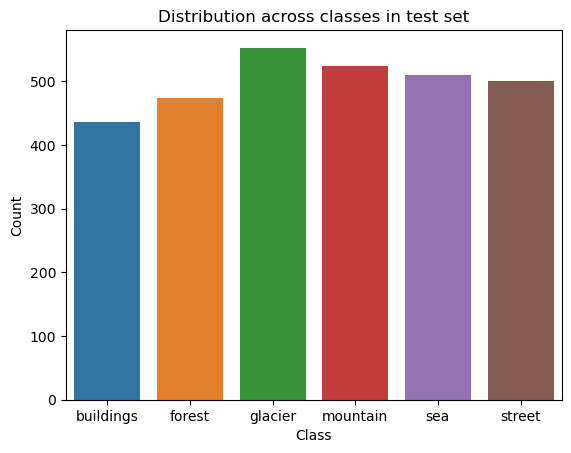

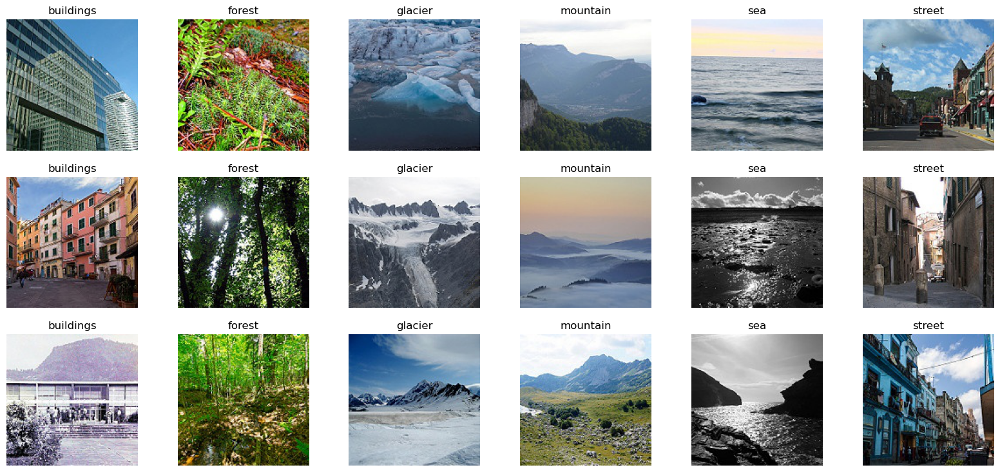

In [9]:
dirnames_test, fnames_test = read_image_names_class(dir_test)
test_summary = check_class_imbalance(fnames_test)
test_summary.head(10)

sns.barplot(data=test_summary, x = 'Class', y='Count').set_title("Distribution across classes in test set")

plot_sampled_images(dir_test, fnames_test)

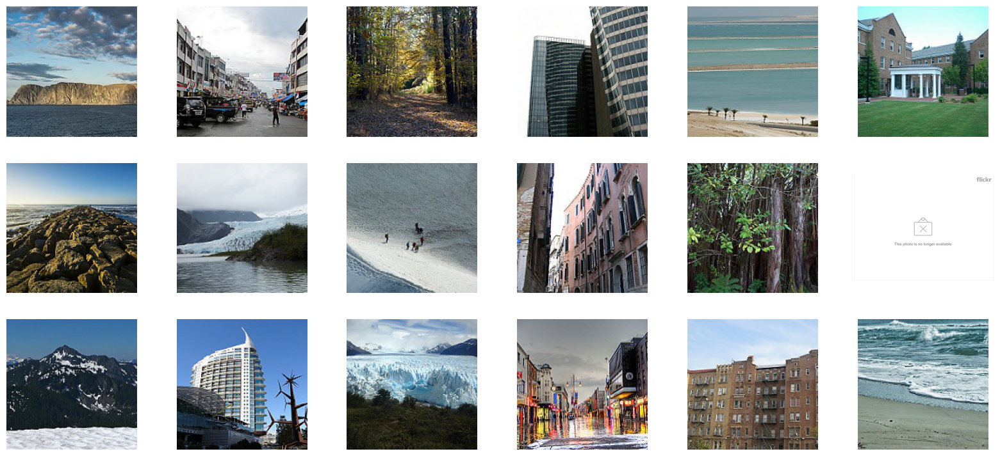

In [10]:
plot_sampled_prediction_images(dir_pred, fnames_pred)

In [11]:
import tensorflow as tf
tf.random.set_seed(0)

In [12]:
batch = 32
shuff = True
train_ds = tf.keras.preprocessing.image_dataset_from_directory(dir_train,
                                                               validation_split=0.2,  subset="training",
                                                               seed=0,  image_size=(150, 150),
                                                               batch_size=batch, shuffle= shuff, label_mode='categorical')
val_ds = tf.keras.preprocessing.image_dataset_from_directory(dir_train,
                                                               validation_split=0.2,  subset="validation",
                                                               seed=0,  image_size=(150, 150),
                                                               batch_size=batch, shuffle= shuff, label_mode='categorical')


Found 14034 files belonging to 6 classes.
Using 11228 files for training.
Found 14034 files belonging to 6 classes.
Using 2806 files for validation.


In [13]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [14]:
import tensorflow as tf

mod = tf.keras.models.Sequential([    
    tf.keras.layers.Rescaling(scale=1./255, input_shape=(150, 150, 3)),
    tf.keras.layers.RandomContrast(factor=0.2),
    tf.keras.layers.RandomFlip(mode="horizontal"),
    tf.keras.layers.RandomRotation(factor=0.05),
    tf.keras.layers.RandomTranslation(height_factor=0.2, width_factor=0.2),
    tf.keras.layers.RandomZoom(height_factor=(0.1, 0.3), width_factor=(0.1, 0.3)),
    tf.keras.layers.Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Conv2D(filters=12, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),    
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Conv2D(filters=12, kernel_size=(1,1), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),    
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),   
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Conv2D(filters=16, kernel_size=(5,5), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),      
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=256, activation='relu'),
    tf.keras.layers.Dense(units=128, activation='relu'),
    tf.keras.layers.Dense(units=6, activation='softmax')
])


In [15]:
mets = ['accuracy', tf.metrics.Precision(), tf.metrics.Recall(), 
        tf.metrics.TrueNegatives(), tf.metrics.TruePositives(), tf.metrics.FalseNegatives(), tf.metrics.FalsePositives()]
mod.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), 
            loss=tf.keras.losses.CategoricalCrossentropy(), metrics= mets)

In [16]:
earlystop = tf.keras.callbacks.EarlyStopping(patience=10, min_delta=1e-3, restore_best_weights=True)
lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', patience=3, verbose=1, factor=0.5, min_lr=1e-7)

In [17]:
hist = mod.fit(train_ds, epochs=3, batch_size=batch, verbose=1, shuffle=shuff, validation_data=val_ds, callbacks=[earlystop, lr])

Epoch 1/3
351/351 ━━━━━━━━━━━━━━━━━━━━ 371s 881ms/step - accuracy: 0.4067 - false_negatives: 4289.9546 - false_positives: 944.1818 - loss: 1.5378 - precision: 0.5350 - recall: 0.2116 - true_negatives: 27288.5449 - true_positives: 1356.5909 - val_accuracy: 0.2113 - val_false_negatives: 2509.0000 - val_false_positives: 412.0000 - val_loss: 2.0043 - val_precision: 0.4189 - val_recall: 0.1058 - val_true_negatives: 13618.0000 - val_true_positives: 297.0000 - learning_rate: 0.0100
Epoch 2/3
351/351 ━━━━━━━━━━━━━━━━━━━━ 283s 808ms/step - accuracy: 0.5677 - false_negatives: 3433.0540 - false_positives: 959.4801 - loss: 1.0794 - precision: 0.6971 - recall: 0.3899 - true_negatives: 27261.9395 - true_positives: 2211.2302 - val_accuracy: 0.5773 - val_false_negatives: 1413.0000 - val_false_positives: 853.0000 - val_loss: 1.2921 - val_precision: 0.6202 - val_recall: 0.4964 - val_true_negatives: 13177.0000 - val_true_positives: 1393.0000 - learning_rate: 0.0100
Epoch 3/3
351/351 ━━━━━━━━━━━━━━━━━━━━ 

In [18]:
mod.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape              ┃    Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 150, 150, 3)       │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ random_contrast                 │ (None, 150, 150, 3)       │          0 │
│ (RandomContrast)                │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ random_flip (RandomFlip)        │ (None, 150, 150, 3)       │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ random_rotation                 │ (None, 150, 150, 3)       │          0 │
│ (RandomRotation)                │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ random_translation              │ (None, 150, 150, 3)       │          0 │
│ (RandomTranslation)             │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ random_zoom (RandomZoom)        │ (None, 150, 150, 3)       │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d (Conv2D)                 │ (None, 150, 150, 16)      │        448 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ batch_normalization             │ (None, 150, 150, 16)      │         64 │
│ (BatchNormalization)            │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dropout (Dropout)               │ (None, 150, 150, 16)      │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_1 (Conv2D)               │ (None, 150, 150, 12)      │      1,740 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ batch_normalization_1           │ (None, 150, 150, 12)      │         48 │
│ (BatchNormalization)            │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dropout_1 (Dropout)             │ (None, 150, 150, 12)      │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 75, 75, 12)        │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_2 (Conv2D)               │ (None, 75, 75, 12)        │        156 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ batch_normalization_2           │ (None, 75, 75, 12)        │         48 │
│ (BatchNormalization)            │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dropout_2 (Dropout)             │ (None, 75, 75, 12)        │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 37, 37, 12)        │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_3 (Conv2D)               │ (None, 37, 37, 16)        │      1,744 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ batch_normalization_3           │ (None, 37, 37, 16)        │         64 │
│ (BatchNormalization)            │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dropout_3 (Dropout)             │ (None, 37, 37, 16)        │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 18, 18, 16)        │          0 │
├─────────────────────────────────┼───────────────────────────┼──────────

 Total params: 1,143,372 (4.36 MB)

 Trainable params: 381,054 (1.45 MB)

 Non-trainable params: 208 (832.00 B)

 Optimizer params: 762,110 (2.91 MB)

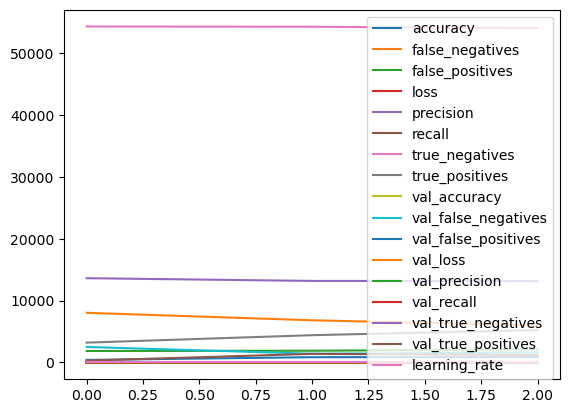

In [19]:
for key in hist.history.keys():
    plt.plot(hist.history[key],label=key)
plt.legend()
# plt.ylim([0,1])

In [20]:
mod.evaluate(train_ds)

351/351 ━━━━━━━━━━━━━━━━━━━━ 41s 117ms/step - accuracy: 0.5372 - false_negatives: 3147.0569 - false_positives: 1795.9972 - loss: 1.2754 - precision: 0.5825 - recall: 0.4443 - true_negatives: 26430.5371 - true_positives: 2498.2500


[1.271852731704712,
 0.5325080156326294,
 6303.0,
 3580.0,
 0.5790711641311646,
 0.43863555788993835,
 52560.0,
 4925.0]

In [21]:
mod.evaluate(val_ds)

88/88 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - accuracy: 0.5281 - false_negatives: 822.9551 - false_positives: 456.2472 - loss: 1.2908 - precision: 0.5661 - recall: 0.4205 - true_negatives: 6740.8315 - true_positives: 616.4607


[1.2850925922393799,
 0.5295794606208801,
 1605.0,
 882.0,
 0.5765722393989563,
 0.428011417388916,
 13148.0,
 1201.0]

Found 3000 files belonging to 6 classes.
94/94 ━━━━━━━━━━━━━━━━━━━━ 21s 222ms/step
94/94 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - accuracy: 0.5747 - false_negatives: 837.0632 - false_positives: 459.0316 - loss: 1.2380 - precision: 0.6552 - recall: 0.4770 - true_negatives: 7218.4419 - true_positives: 698.4316


[1.2871850728988647,
 0.5266666412353516,
 1666.0,
 924.0,
 0.5907883048057556,
 0.44466665387153625,
 14076.0,
 1334.0]

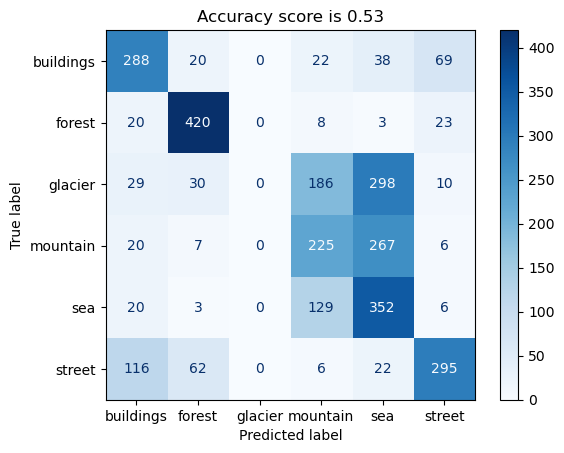

In [22]:
test_ds = tf.keras.preprocessing.image_dataset_from_directory(dir_test, seed=0,  image_size=(150, 150),
                                                               batch_size=batch, shuffle= False, label_mode='categorical')
# y_test = mod.predict(test_ds)
# tf.keras.utils.to_categorical(np.argmax(y_test,axis=1))
y_true, y_pred = get_true_pred(mod, test_ds)
plot_confMat(y_true, y_pred)

mod.evaluate(test_ds)